In [2]:
df_population.columns

Index(['기준_년분기_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '상권_코드_명', '총_유동인구_수',
       '남성_유동인구_수', '여성_유동인구_수', '연령대_10_유동인구_수', '연령대_20_유동인구_수',
       '연령대_30_유동인구_수', '연령대_40_유동인구_수', '연령대_50_유동인구_수', '연령대_60_이상_유동인구_수',
       '시간대_00_06_유동인구_수', '시간대_06_11_유동인구_수', '시간대_11_14_유동인구_수',
       '시간대_14_17_유동인구_수', '시간대_17_21_유동인구_수', '시간대_21_24_유동인구_수',
       '월요일_유동인구_수', '화요일_유동인구_수', '수요일_유동인구_수', '목요일_유동인구_수', '금요일_유동인구_수',
       '토요일_유동인구_수', '일요일_유동인구_수'],
      dtype='object')

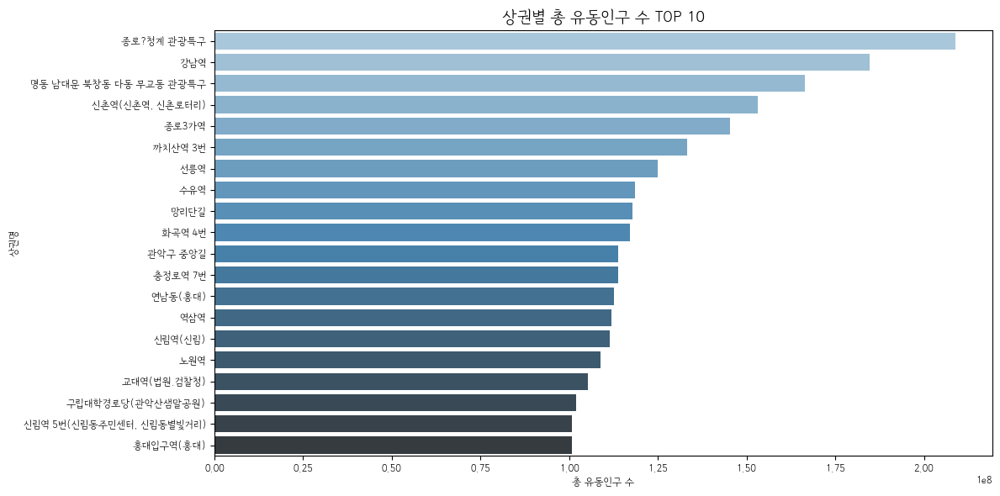

In [ ]:
# 분기 당 총 유동인구 수

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc
import seaborn as sns

# 한글 폰트 설정
font_path = r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\fonts\강원교육모두 Light.ttf'
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)
plt.rcParams['axes.unicode_minus'] = False

# 데이터 불러오기 (파일 경로 수정 필요)
df_population = pd.read_csv(r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\Yesha\서울시 상권분석서비스(길단위인구-상권).csv', encoding='euc-kr')

# 인구 수 column 참조용
"""
Index(['기준_년분기_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '상권_코드_명', '총_유동인구_수',
       '남성_유동인구_수', '여성_유동인구_수', '연령대_10_유동인구_수', '연령대_20_유동인구_수',
       '연령대_30_유동인구_수', '연령대_40_유동인구_수', '연령대_50_유동인구_수', '연령대_60_이상_유동인구_수',
       '시간대_00_06_유동인구_수', '시간대_06_11_유동인구_수', '시간대_11_14_유동인구_수',
       '시간대_14_17_유동인구_수', '시간대_17_21_유동인구_수', '시간대_21_24_유동인구_수',
       '월요일_유동인구_수', '화요일_유동인구_수', '수요일_유동인구_수', '목요일_유동인구_수', '금요일_유동인구_수',
       '토요일_유동인구_수', '일요일_유동인구_수'],
      dtype='object')
"""

# 상권별 총 유동인구 수 집계
df_pop_total = df_population.groupby(['상권_코드', '상권_코드_명'])['총_유동인구_수'].sum().reset_index()
df_pop_total.rename(columns={'총_유동인구_수': '상권별_총유동인구'}, inplace=True)

# 상위 10개 상권 시각화
plt.figure(figsize=(12, 6))
top10 = df_pop_total.sort_values(by='상권별_총유동인구', ascending=False).head(20)

sns.barplot(data=top10, x='상권별_총유동인구', y='상권_코드_명', hue='상권_코드_명', palette='Blues_d', legend=False)

plt.title('상권별 총 유동인구 수 TOP 10', fontsize=16)
plt.xlabel('총 유동인구 수')
plt.ylabel('상권명')

plt.tight_layout()
plt.show()


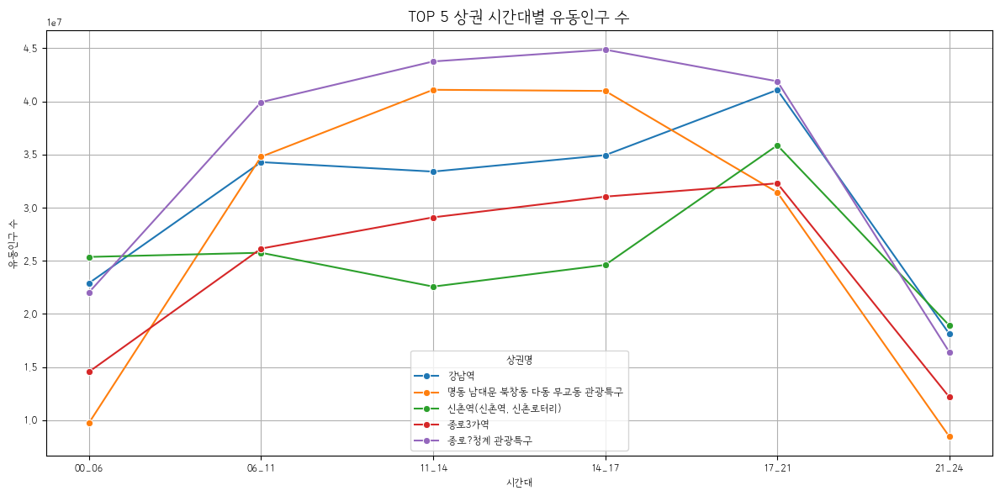

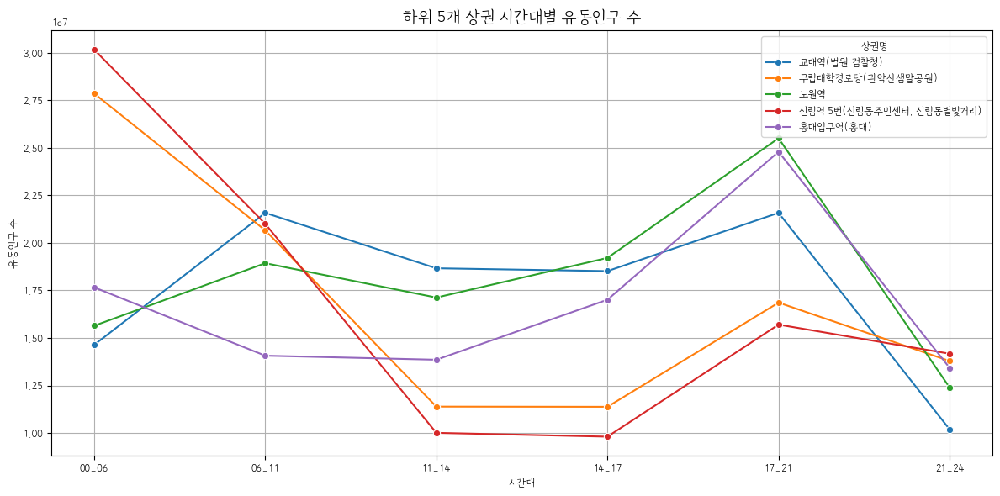

In [4]:
# 분기 당 총 유동인구 수

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc
import seaborn as sns

# 한글 폰트 설정
font_path = r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\fonts\강원교육모두 Light.ttf'
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)
plt.rcParams['axes.unicode_minus'] = False

# 데이터 불러오기 (파일 경로 수정 필요)
df_population = pd.read_csv(r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\Yesha\서울시 상권분석서비스(길단위인구-상권).csv', encoding='euc-kr')

# 상권별 총 유동인구 수 집계
df_pop_total = df_population.groupby(['상권_코드', '상권_코드_명'])['총_유동인구_수'].sum().reset_index()
df_pop_total.rename(columns={'총_유동인구_수': '상권별_총유동인구'}, inplace=True)

# 시간대 컬럼 리스트
time_columns = ['시간대_00_06_유동인구_수', '시간대_06_11_유동인구_수', '시간대_11_14_유동인구_수',
                '시간대_14_17_유동인구_수', '시간대_17_21_유동인구_수', '시간대_21_24_유동인구_수']

# 상위 5개 상권 코드 추출
top5_codes = top10.head(5)['상권_코드'].tolist()

# top5 상권 데이터 필터링
df_top5 = df_population[df_population['상권_코드'].isin(top5_codes)]

# 상권/시간대별 유동인구 합산
df_time = df_top5.groupby(['상권_코드_명'])[time_columns].sum().reset_index()

# melt해서 long-form으로 변환 (시각화에 유리)
df_time_melted = df_time.melt(id_vars='상권_코드_명', var_name='시간대', value_name='유동인구수')

# 시간대 라벨 정리
df_time_melted['시간대'] = df_time_melted['시간대'].str.replace('시간대_', '').str.replace('_유동인구_수', '')
df_time_melted['시간대'] = pd.Categorical(df_time_melted['시간대'],
                                          categories=['00_06', '06_11', '11_14', '14_17', '17_21', '21_24'],
                                          ordered=True)

# 시각화
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_time_melted, x='시간대', y='유동인구수', hue='상권_코드_명', marker='o')

plt.title('TOP 5 상권 시간대별 유동인구 수', fontsize=16)
plt.xlabel('시간대')
plt.ylabel('유동인구 수')
plt.legend(title='상권명')
plt.grid(True)
plt.tight_layout()
plt.show()



bot5_codes = top10.tail(5)['상권_코드'].tolist()

df_bot5 = df_population[df_population['상권_코드'].isin(bot5_codes)]

# 상권/시간대별 유동인구 합산
df_time = df_bot5.groupby(['상권_코드_명'])[time_columns].sum().reset_index()

# melt해서 long-form으로 변환 (시각화에 유리)
df_time_melted = df_time.melt(id_vars='상권_코드_명', var_name='시간대', value_name='유동인구수')

# 시간대 라벨 정리
df_time_melted['시간대'] = df_time_melted['시간대'].str.replace('시간대_', '').str.replace('_유동인구_수', '')
df_time_melted['시간대'] = pd.Categorical(df_time_melted['시간대'],
                                          categories=['00_06', '06_11', '11_14', '14_17', '17_21', '21_24'],
                                          ordered=True)

# 시각화
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_time_melted, x='시간대', y='유동인구수', hue='상권_코드_명', marker='o')

plt.title('하위 5개 상권 시간대별 유동인구 수', fontsize=16)
plt.xlabel('시간대')
plt.ylabel('유동인구 수')
plt.legend(title='상권명')
plt.grid(True)
plt.tight_layout()
plt.show()

### 고려해야 하는 사항
1. feature로 사용해야 할 것들
2. 시간대별 유동인구 차이 / 성별의 유동인구 차이
3. 직장인구 / 상주인구 / 길단위 인구 `(어떻게 활용할 것인가?)`

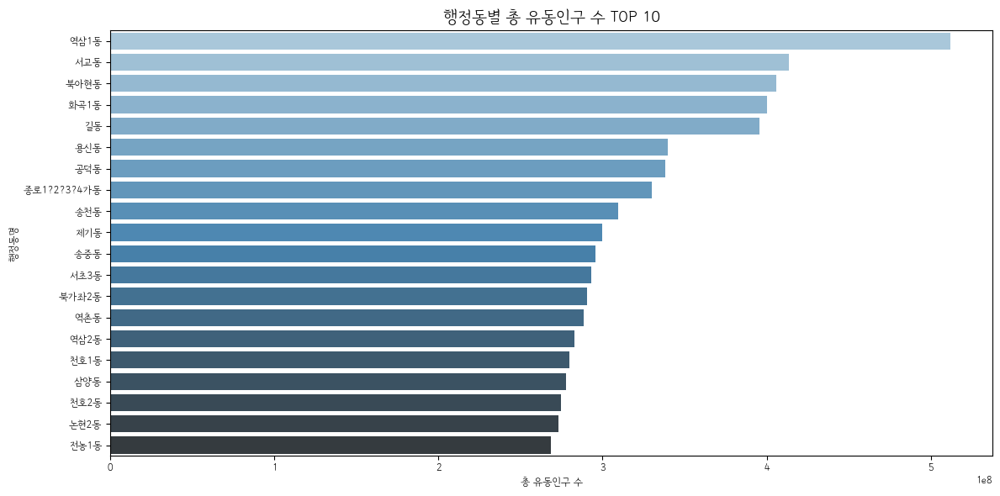

In [7]:
# 분기 당 총 유동인구 수 -행정동별

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc
import seaborn as sns

# 한글 폰트 설정
font_path = r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\fonts\강원교육모두 Light.ttf'
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)
plt.rcParams['axes.unicode_minus'] = False

# 데이터 불러오기 (파일 경로 수정 필요)
df_population = pd.read_csv(r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\Yesha\서울시 상권분석서비스(길단위인구-행정동).csv', encoding='euc-kr')

# 상권별 총 유동인구 수 집계
df_pop_total = df_population.groupby(['행정동_코드', '행정동_코드_명'])['총_유동인구_수'].sum().reset_index()
df_pop_total.rename(columns={'총_유동인구_수': '행정동별_총유동인구'}, inplace=True)

# 상위 10개 상권 시각화
plt.figure(figsize=(12, 6))
top10 = df_pop_total.sort_values(by='행정동별_총유동인구', ascending=False).head(20)

sns.barplot(data=top10, x='행정동별_총유동인구', y='행정동_코드_명', hue='행정동_코드_명', palette='Blues_d', legend=False)

plt.title('행정동별 총 유동인구 수 TOP 10', fontsize=16)
plt.xlabel('총 유동인구 수')
plt.ylabel('행정동명')

plt.tight_layout()
plt.show()


### 나머지 시각화 참고자료

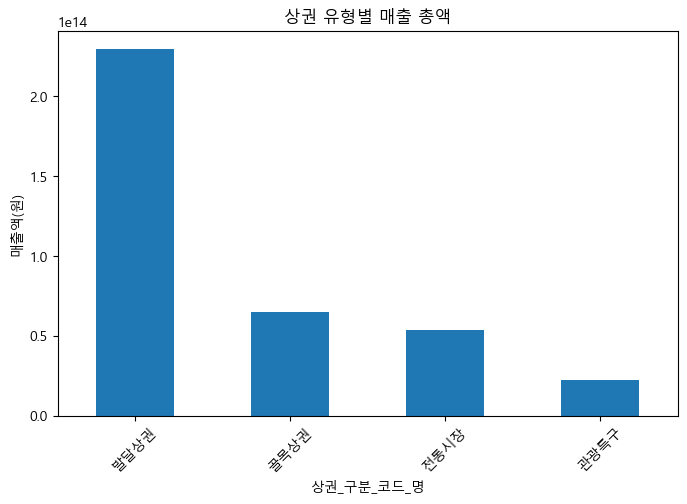

In [20]:
## 상권 유형별 매출
sales_by_type = df_merge.groupby('상권_구분_코드_명')['당월_매출_금액'].sum().sort_values(ascending=False)
plt.figure(figsize=(8,5))
sales_by_type.plot(kind='bar')
plt.title('상권 유형별 매출 총액')
plt.ylabel('매출액(원)')
plt.xticks(rotation=45)
plt.show()

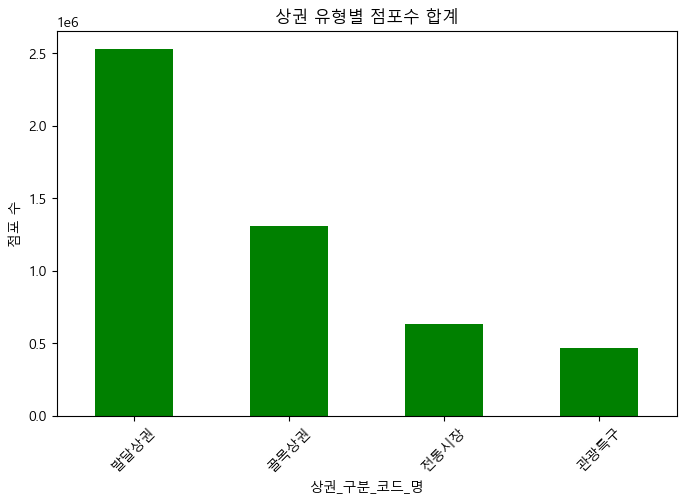

In [21]:
## 상권 유형별 점포수
stores_by_type = df_merge.groupby('상권_구분_코드_명')['점포_수'].sum().sort_values(ascending=False)
plt.figure(figsize=(8,5))
stores_by_type.plot(kind='bar', color='green')
plt.title('상권 유형별 점포수 합계')
plt.ylabel('점포 수')
plt.xticks(rotation=45)
plt.show()

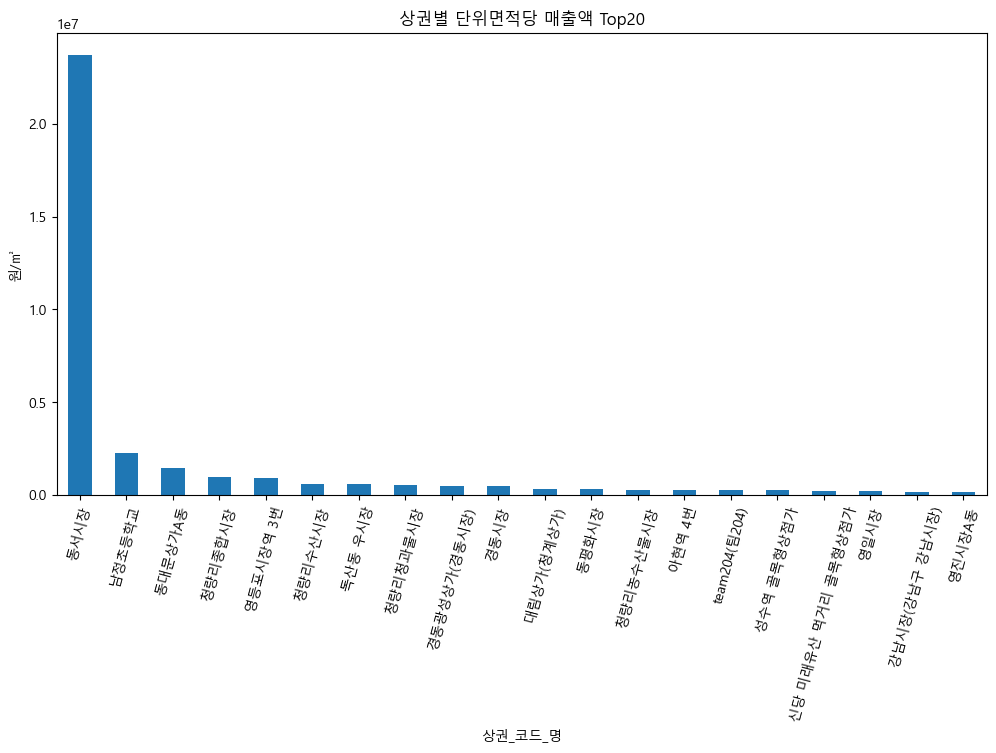

In [22]:
## 단위면적당 매출액 Top20
unit_sales = df_merge.groupby('상권_코드_명')['단위면적당_매출액'].mean().sort_values(ascending=False)
plt.figure(figsize=(12,6))
unit_sales.head(20).plot(kind='bar')
plt.title('상권별 단위면적당 매출액 Top20')
plt.ylabel('원/㎡')
plt.xticks(rotation=75)
plt.show()

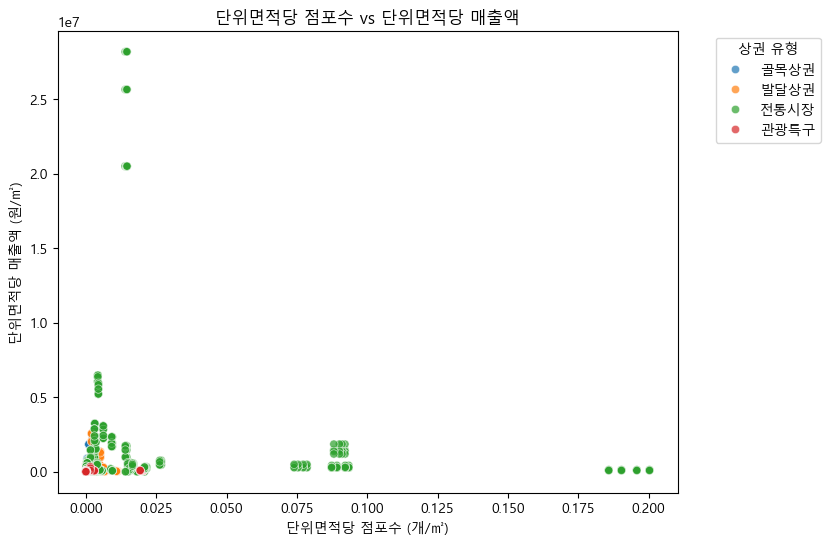

In [23]:
## 단위면적당 점포수 vs 단위면적당 매출액
plt.figure(figsize=(8,6))
sns.scatterplot(data=df_merge, x='단위면적당_점포수', y='단위면적당_매출액', hue='상권_구분_코드_명', alpha=0.7)
plt.title('단위면적당 점포수 vs 단위면적당 매출액')
plt.xlabel('단위면적당 점포수 (개/㎡)')
plt.ylabel('단위면적당 매출액 (원/㎡)')
plt.legend(title='상권 유형', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

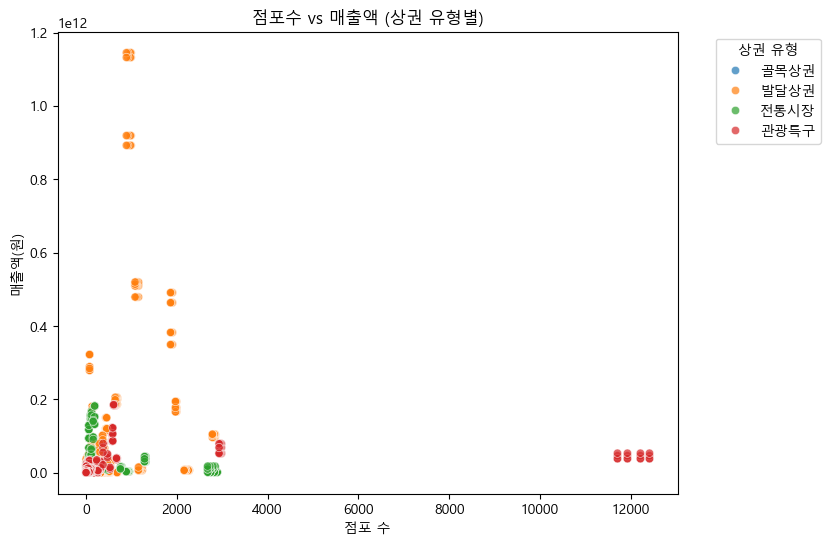

In [ ]:
# 점포수 vs 매출액 관계
df_merge = pd.merge(df_stores, df_sales, on=['상권_코드', '상권_코드_명', '상권_구분_코드', '상권_구분_코드_명', '서비스_업종_코드', '서비스_업종_코드_명'])

plt.figure(figsize=(8,6))
sns.scatterplot(data=df_merge, x='점포_수', y='당월_매출_금액', hue='상권_구분_코드_명', alpha=0.7)
plt.title('점포수 vs 매출액 (상권 유형별)')
plt.xlabel('점포 수')
plt.ylabel('매출액(원)')
plt.legend(title='상권 유형', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

카페 관련 업종 데이터 개수: 17392


,기준_년분기_코드_x,상권_구분_코드,상권_구분_코드_명,상권_코드,상권_코드_명,서비스_업종_코드,서비스_업종_코드_명,점포_수,유사_업종_점포_수,개업_율,...,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,영역_면적,단위면적당_점포수,단위면적당_매출액
22,20241,A,골목상권,3110002,독립문역 1번,CS100010,커피-음료,2,4,0,...,3904,59,508,994,1108,2123,1293,31531,0.000063,1794.056104
23,20241,A,골목상권,3110002,독립문역 1번,CS100010,커피-음료,2,4,0,...,4401,239,445,1071,1247,2428,1336,31531,0.000063,1797.595065
24,20241,A,골목상권,3110002,독립문역 1번,CS100010,커피-음료,2,4,0,...,4164,74,455,1157,1308,2275,1385,31531,0.000063,1828.030859
25,20241,A,골목상권,3110002,독립문역 1번,CS100010,커피-음료,2,4,0,...,3935,89,323,1132,1263,1704,1520,31531,0.000063,1671.041388
54,20241,A,골목상권,3110003,세검정초등학교,CS100010,커피-음료,4,6,0,...,1732,49,395,546,734,1064,705,191570,0.000021,133.444438


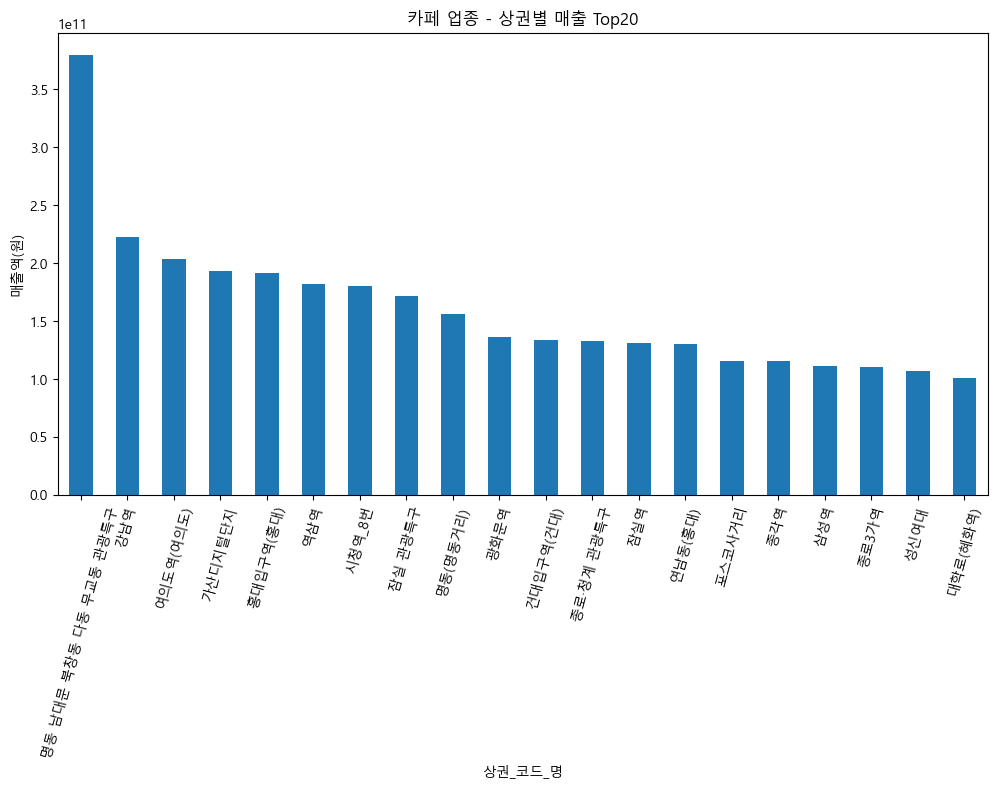

In [24]:
df_cafe = df_merge[df_merge['서비스_업종_코드_명'].str.contains('커피|카페', na=False)]

print("카페 관련 업종 데이터 개수:", len(df_cafe))
display(df_cafe.head())

cafe_sales_by_area = df_cafe.groupby('상권_코드_명')['당월_매출_금액'].sum().sort_values(ascending=False)

plt.figure(figsize=(12,6))
cafe_sales_by_area.head(20).plot(kind='bar')
plt.title('카페 업종 - 상권별 매출 Top20')
plt.ylabel('매출액(원)')
plt.xticks(rotation=75)
plt.show()

## 행정동 & 상권 구분

In [1]:
%pip install geopandas folium

   ---------------------------------------- 0.0/16.2 MB ? eta -:--:--
   --- ------------------------------------ 1.3/16.2 MB 6.7 MB/s eta 0:00:03
   ------- -------------------------------- 2.9/16.2 MB 7.3 MB/s eta 0:00:02
   ----------- ---------------------------- 4.5/16.2 MB 7.3 MB/s eta 0:00:02
   -------------- ------------------------- 6.0/16.2 MB 7.5 MB/s eta 0:00:02
   ------------------- -------------------- 7.9/16.2 MB 7.6 MB/s eta 0:00:02
   ------------------------ --------------- 9.7/16.2 MB 7.7 MB/s eta 0:00:01
   --------------------------- ------------ 11.3/16.2 MB 7.7 MB/s eta 0:00:01
   -------------------------------- ------- 13.1/16.2 MB 7.9 MB/s eta 0:00:01
   ----------------------------------- ---- 14.4/16.2 MB 7.7 MB/s eta 0:00:01
   ------------------------------------- -- 15.2/16.2 MB 7.4 MB/s eta 0:00:01
   ---------------------------------------- 16.2/16.2 MB 7.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/6.3 MB ? eta -:--:--
   ----- 

In [9]:
import geopandas as gpd
import folium

# 1. 파일 읽기
gdf_market = gpd.read_file(r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\상권_행정구역_구분\서울시 상권분석서비스(영역-상권).shp')
gdf_admin = gpd.read_file(r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\상권_행정구역_구분\LSMD_ADM_SECT_UMD_11_202504.shp')

# 2. 좌표계 변환
gdf_market = gdf_market.to_crs(epsg=4326)
gdf_admin = gdf_admin.to_crs(epsg=4326)

# 3. 서울 지도 기본 생성
seoul_map = folium.Map(location=[37.5665, 126.9780], zoom_start=12)

# 4. 상권 경계선 (파란색 + 두껍게)
folium.GeoJson(
    gdf_market,
    name='상권 경계',
    style_function=lambda x: {
        'color': 'blue',
        'weight': 2,
        'fillOpacity': 0  # 영역 채우지 않음
    }
).add_to(seoul_map)

# 5. 행정동 경계선 (빨간색 + 얇게)
folium.GeoJson(
    gdf_admin,
    name='행정동 경계',
    style_function=lambda x: {
        'color': 'red',
        'weight': 1.5,
        'fillOpacity': 0
    }
).add_to(seoul_map)

# 6. Layer Control 추가
folium.LayerControl().add_to(seoul_map)

# 7. 지도 출력
seoul_map

In [14]:
import geopandas as gpd
import folium

# 파일 읽기
gdf_market = gpd.read_file(r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\상권_행정구역_구분\서울시 상권분석서비스(영역-상권).shp')
gdf_admin = gpd.read_file(r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\상권_행정구역_구분\LSMD_ADM_SECT_UMD_11_202504.shp')

# 1. 좌표계 변환 (둘 다 EPSG:4326으로)
gdf_market = gdf_market.to_crs(epsg=4326)
gdf_admin = gdf_admin.to_crs(epsg=4326)

# 2. 교차 영역 계산 (intersect)
intersected = gpd.overlay(gdf_market[['TRDAR_CD', 'geometry']], gdf_admin[['EMD_CD', 'geometry']],
                          how='intersection')

# 3. 교차 영역 결과 확인
print(intersected.head())

  TRDAR_CD    EMD_CD                                           geometry
0  3110008  11110115  POLYGON ((126.96903 37.57626, 126.96888 37.576...
1  3110008  11110113  MULTIPOLYGON (((126.96941 37.57806, 126.96943 ...
2  3110008  11110109  MULTIPOLYGON (((126.96741 37.57934, 126.96747 ...
3  3110008  11110111  POLYGON ((126.96557 37.583, 126.96566 37.58303...
4  3110008  11110110  POLYGON ((126.96862 37.58043, 126.96865 37.580...


In [ ]:
# 1. 교차 영역 면적 계산
intersected['intersect_area'] = intersected.geometry.area

# 2. 상권의 총 면적 계산 (상권별 면적)
market_areas = gdf_market[['TRDAR_CD', 'geometry']]
market_areas['market_area'] = market_areas.geometry.area

# 3. 교차된 영역에 대해 면적 비율 계산 (교차된 면적 / 상권 면적)
intersected['area_ratio'] = intersected['intersect_area'] / intersected['TRDAR_CD'].map(market_areas.set_index('TRDAR_CD')['market_area'])

# 4. 행정동별 유동인구 추출 (행정동 코드에 맞는 유동인구 값 매칭)
df_admin_pop = pd.read_csv(r'C:\Users\iq750\bootcamp_git\Final-Project-2_Team1\Yesha\서울시 상권분석서비스(길단위인구-행정동).csv')  # 유동인구 CSV 파일을 불러옴
intersected = intersected.merge(df_admin_pop[['행정동_코드', '총_유동인구_수']], 
                                left_on='EMD_CD', right_on='행정동_코드', how='left')

# 5. 하나의 상권이 두 개 이상의 행정동에 걸쳐 있을 경우 유동인구 배분 (면적 비율로 배분)
intersected['estimated_pop'] = intersected['총_유동인구_수'] * intersected['area_ratio']

# 6. 상권별 유동인구 합산 (하나의 상권이 여러 행정동에 걸쳐 있을 때, 각 교차 영역의 유동인구를 합산)
market_population = intersected.groupby('TRDAR_CD').agg({'estimated_pop': 'sum'}).reset_index()

# 7. 결과 확인
print(intersected[['TRDAR_CD', 'EMD_CD', 'intersect_area', 'area_ratio', 'estimated_pop']].head())
print(market_population.head())

# 8. 결과를 CSV 파일로 저장
intersected.to_csv('estimated_population_by_intersection.csv', index=False)
market_population.to_csv('market_population_sum.csv', index=False)